# UDACITY SDCND Project4:  Advanced Lane Finding


In this project of Advance Lane Finding, I have considered follwoing points: 

1> Camera Calibration

2> Distortion Correction

3> Binary Threshold 

4> Perspective Transform

With these, I tried to find the lanes of different colors and identified the vehicle path under various conditions.



In [1]:
import numpy as np
import os
import cv2
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import pickle
import glob

from collections import deque
from moviepy.editor import VideoFileClip
from scipy.misc import imsave


# Camera Calibration and Distortion Correction

As the first step, idea was to remove any kind of disortion of the image. 
With the help of geven chesboard images, we have calibrated the camera and identified calibration matrix and distortion coefficient. 

Using these calibartion matrix and distortion coefiicient we have defined the function, which converts test images into undistorted images. 

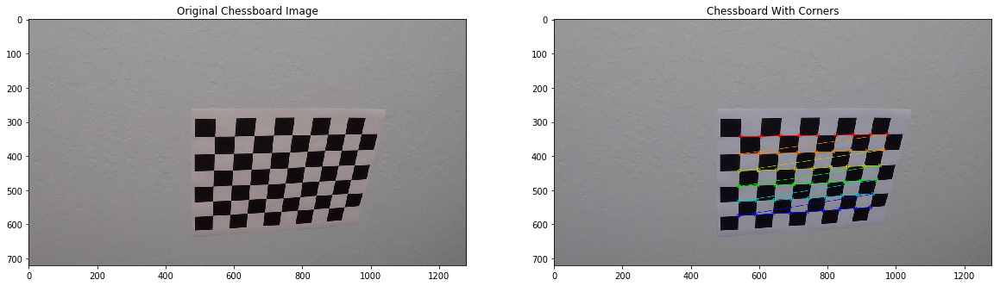

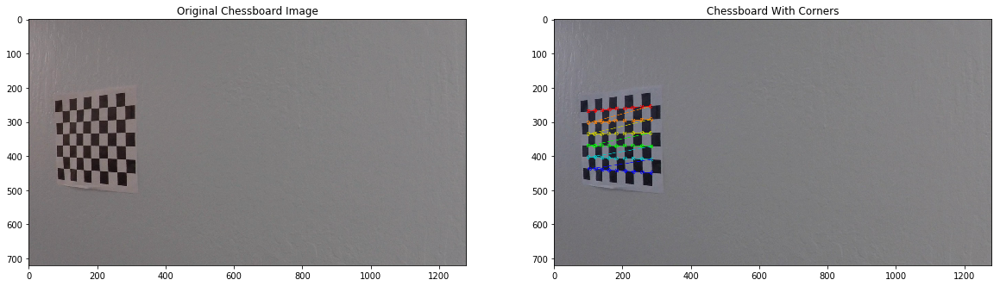

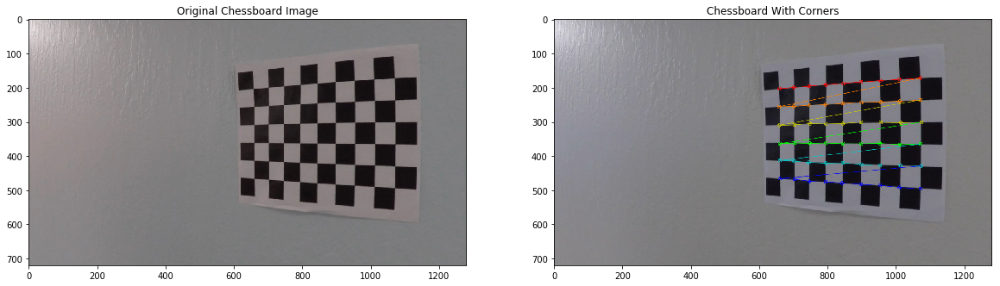

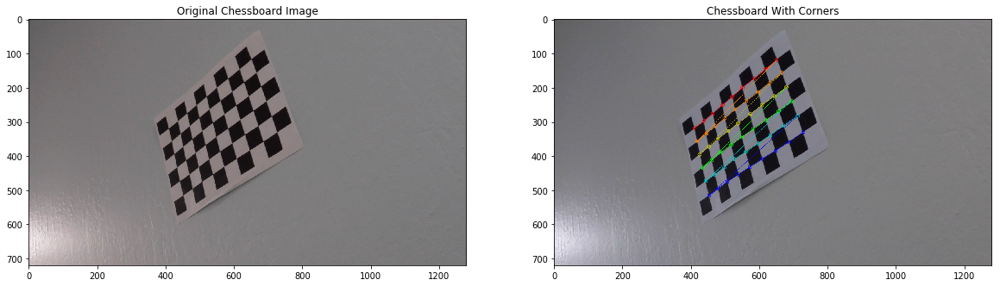

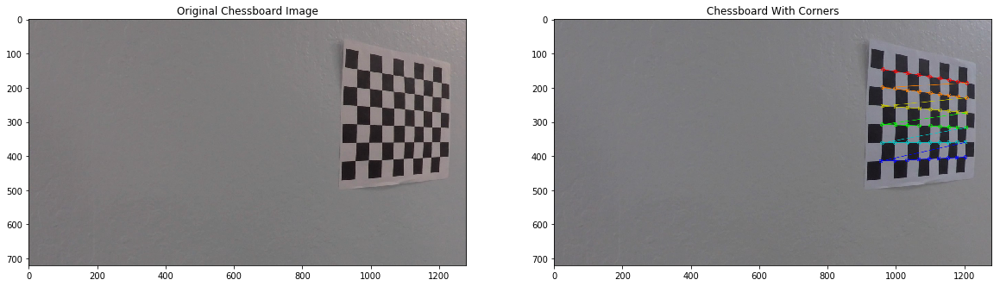

...

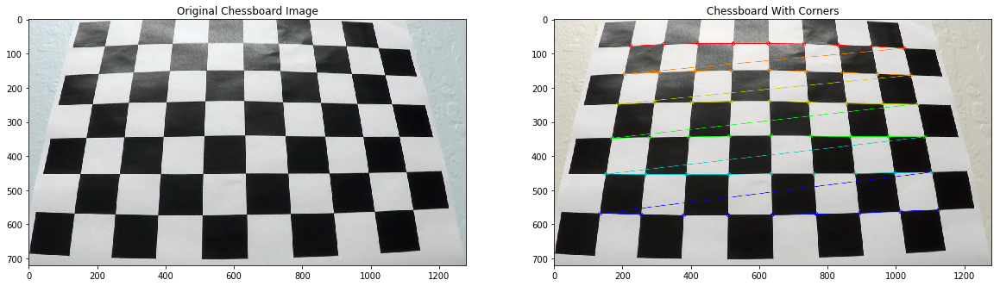

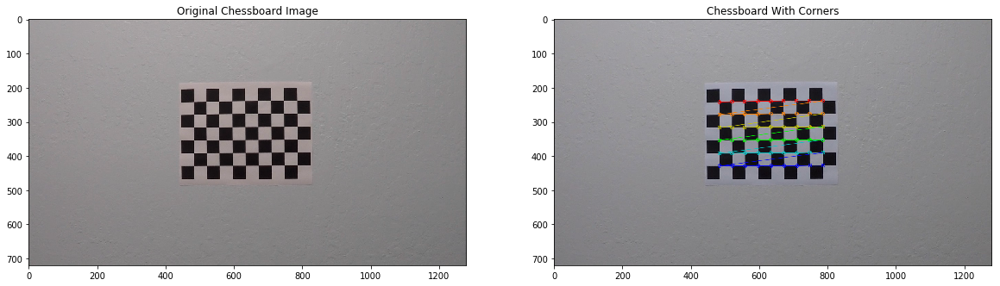

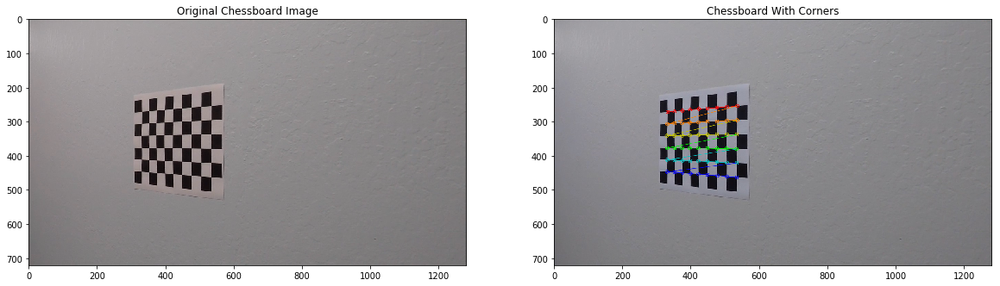

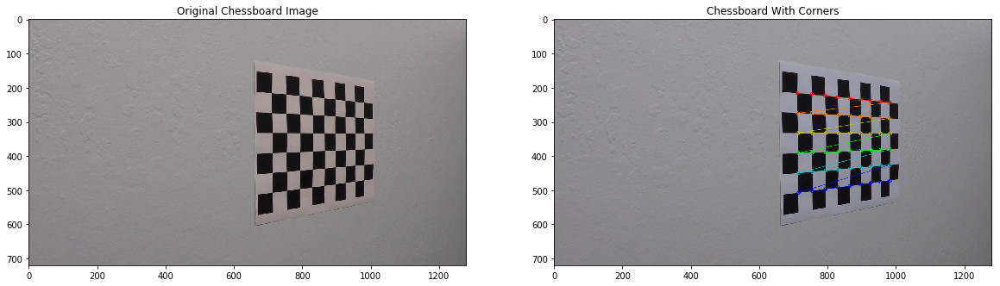

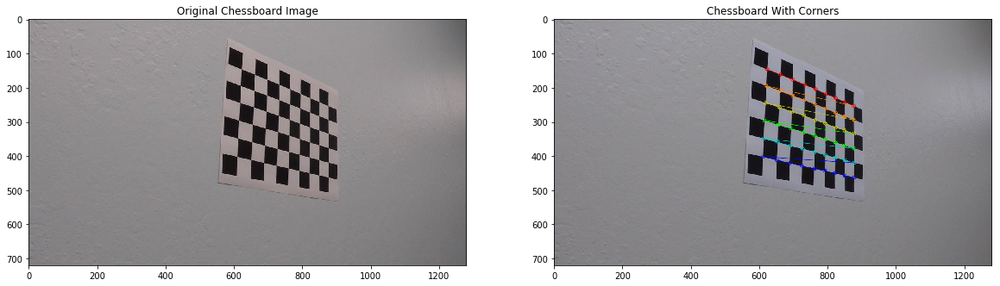

In [2]:
%matplotlib inline

nx=9 #number of inside corners in x
ny=6 #number of inside corners in y

objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

objp = np.zeros((nx*ny,3), np.float32)
objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)

images = glob.glob('camera_cal/calibration*.jpg')

for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
        
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
        
        ax1.imshow(cv2.cvtColor(mpimg.imread(fname), cv2.COLOR_BGR2RGB))
        ax1.set_title('Original Chessboard Image')
        
        ax2.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax2.set_title('Chessboard With Corners')

# Distortion correction of test images

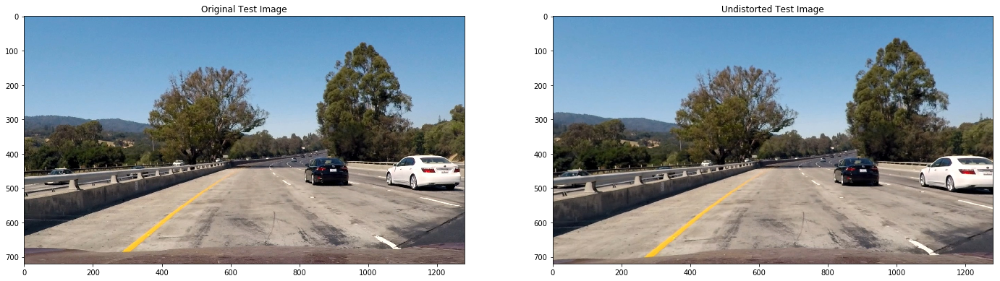

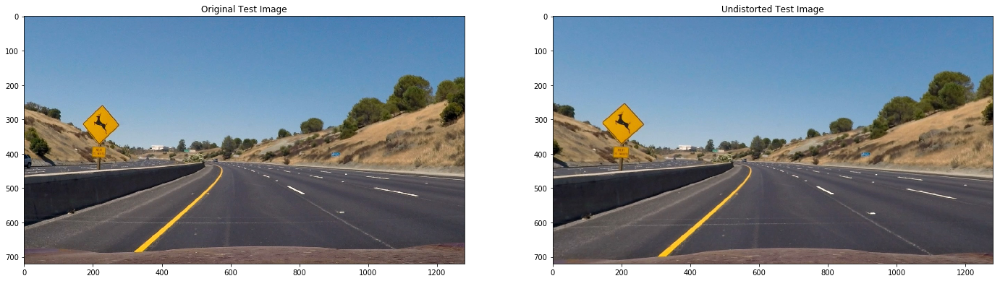

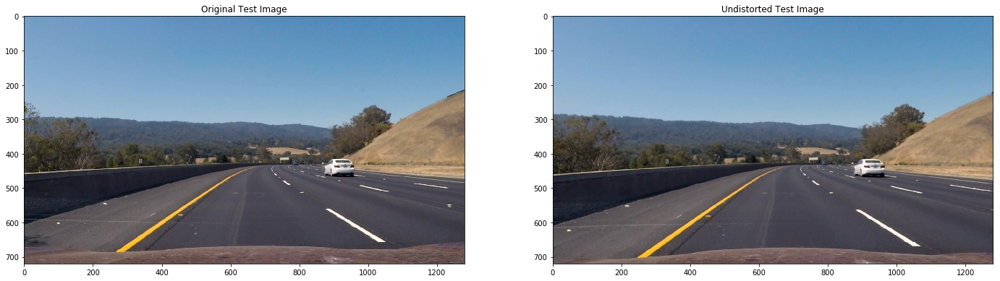

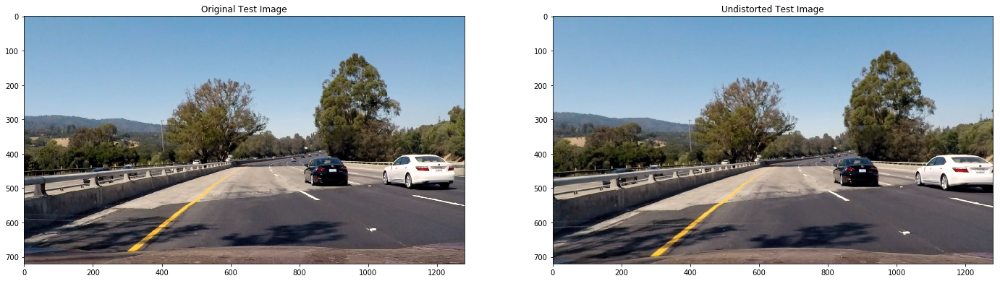

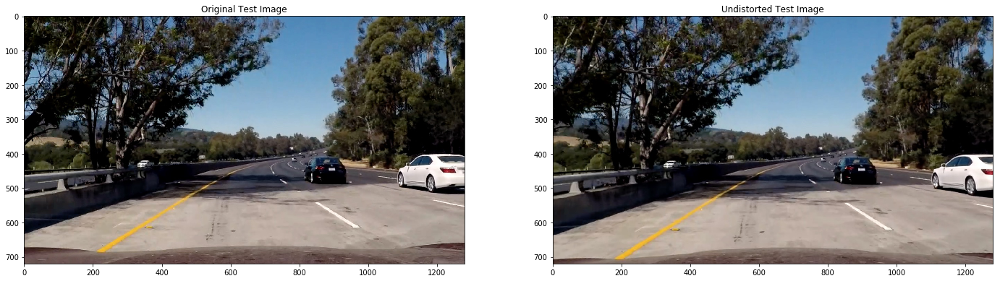

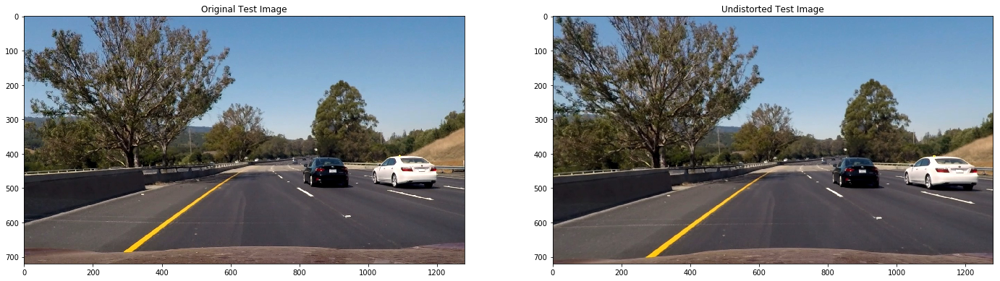

In [3]:
# Test images undistortion 

def undistort(image, show=True, read = True):
    if read:
        img = cv2.imread(image)
    
    img_size = (img.shape[1], img.shape[0])
    
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
    
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    if show:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24,9))
        
        ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax1.set_title('Original Test Image')
        
        ax2.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
        ax2.set_title('Undistorted Test Image')
    else:
        return undist
    
images = glob.glob('test_images/test*.jpg')

for image in images:
    undistort(image)

# Perspective Transform

Here undistorted images have been transformed, so that it can be effectively viewed from different directions. Since left and right curves can be misjudged as having different curve radius or as if they are not parallel, while viewing from different angles.

Here a warp function has been defined, which takes undistorted image as input and converts it into warped image, which gives a birds eye view perspective of the lane.

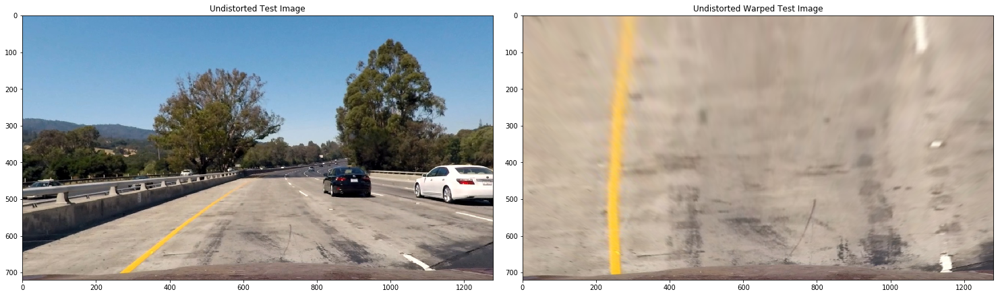

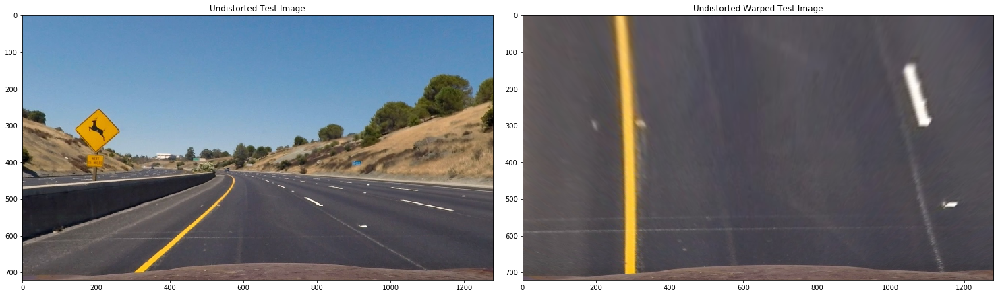

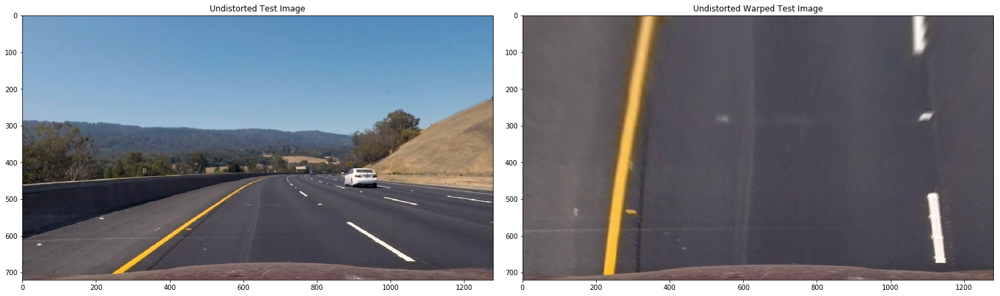

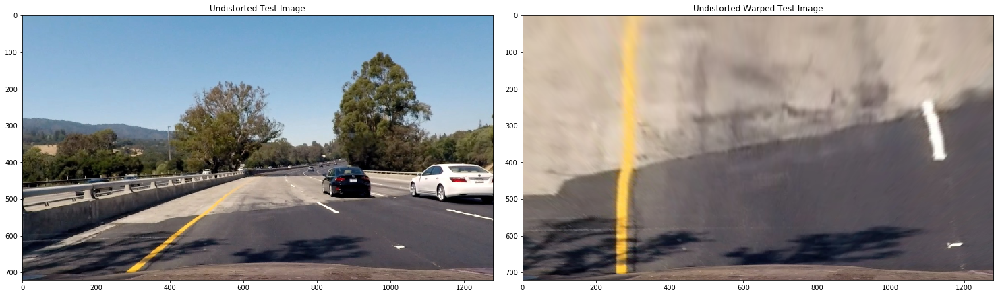

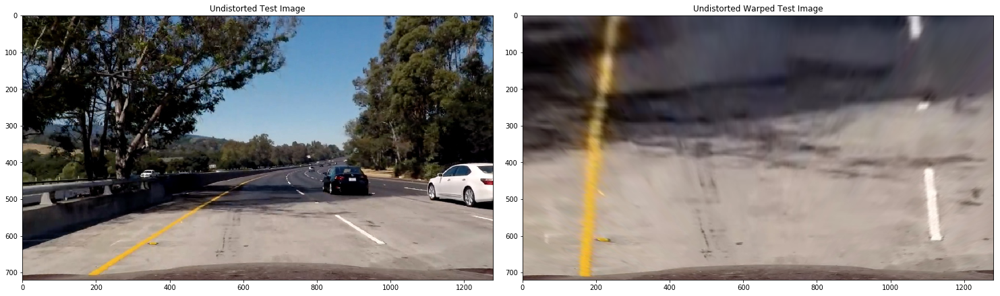

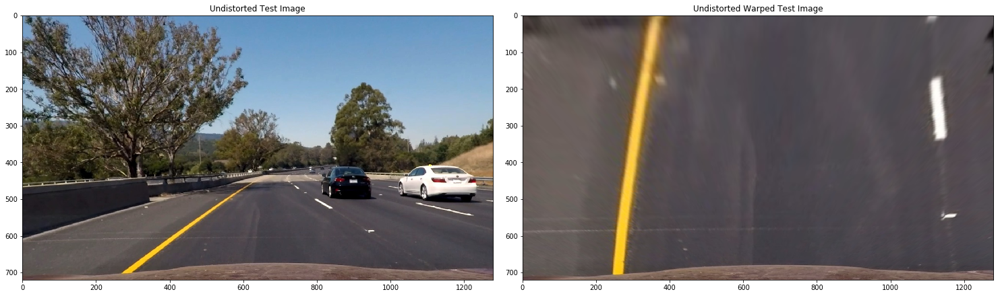

In [4]:
# Define perspective transfer function on test images

def warp(img, display=True, read = True):
    
    if read:
        undist = undistort(img, show = False)
    else:
        undist = undistort(img, show = False, read=False) 
        
    img_size = (undist.shape[1], undist.shape[0])

    
    #offset = 0
    
    src = np.float32([[490, 482],[810, 482],[1250, 720],[50, 720]])
    dst = np.float32([[0, 0], [1280, 0], [1250, 720],[50, 720]])
    
    
    #Compute the perspective transform, M, given source and destination points:
    M = cv2.getPerspectiveTransform(src, dst)
    
    #Warp an image using the perspective transform, M:
    warped = cv2.warpPerspective(undist, M, img_size, flags=cv2.INTER_LINEAR)
    
    if display:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
        f.tight_layout()
        
        ax1.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
        ax1.set_title('Undistorted Test Image')
        
        ax2.imshow(cv2.cvtColor(warped, cv2.COLOR_BGR2RGB))
        ax2.set_title('Undistorted Warped Test Image')
        
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
        
    else:
        return warped, M
    
images = glob.glob('test_images/test*.jpg')
    
for image in images:
    warp(image)

# Binary Threshoulds

Once the warped images are generated, it is used for generating binary image of the lane. Since these images are having many details which are not important for the vehicle to drive, it was needed to be removed. And there are important details, like lane colors, which are needed to be highlighted.

There are several methods to use for this purpose. 

Since I was unable to higlight the yellow and white lines simultaneously with any single methods. I used multiple threshould to get the desired result on the test images. 

WHile using S channel from HLS color space, though it was highlighting the lane lines properly in most of the test images, in sme test images it was getting distorted.
Using Lab color space, its B color channel has done a decent job for yellow lane but was not effective for the white lane.
Similarly, L channel of LUV color space is good for whilte lane lines but not efficient for yellow lane lines. 

To create a satisfactory output, all above color channel thresholds have been combined and tested on the undistorted test images. 



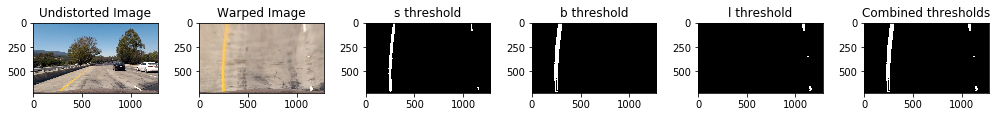

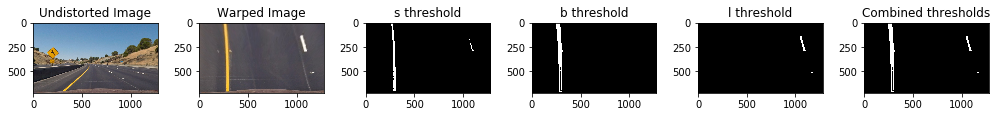

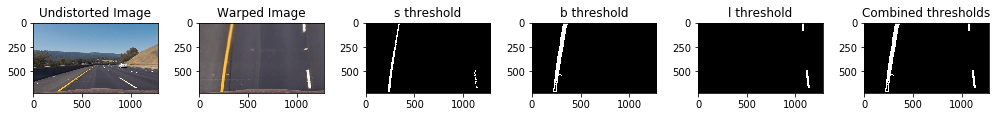

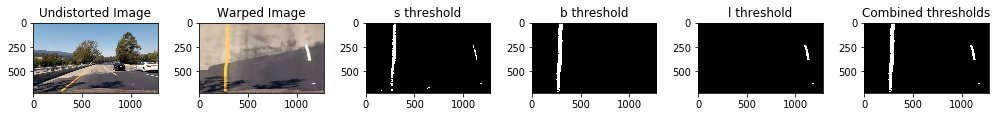

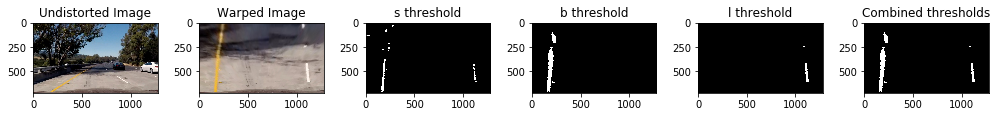

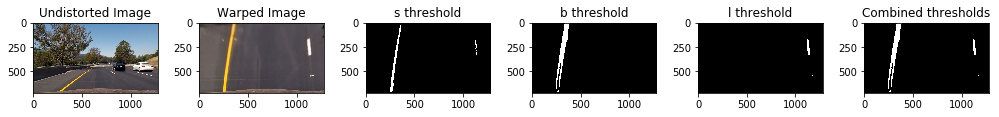

In [5]:
# binary threshold image

def thresholds(image, show=True):
    img, M = warp(image, display = False)

    s_channel = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)[:,:,2]
    l_channel = cv2.cvtColor(img, cv2.COLOR_BGR2LUV)[:,:,0]
    b_channel = cv2.cvtColor(img, cv2.COLOR_BGR2Lab)[:,:,2]   

    # S threshold in HLS
    s_thresh_min = 180
    s_thresh_max = 255
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1
    
    # L threshold in LUV
    l_thresh_min = 225
    l_thresh_max = 255
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= l_thresh_min) & (l_channel <= l_thresh_max)] = 1
    
    # B threshold in Lab
    b_thresh_min = 155
    b_thresh_max = 200
    b_binary = np.zeros_like(b_channel)
    b_binary[(b_channel >= b_thresh_min) & (b_channel <= b_thresh_max)] = 1
    
    
    comb_binary = np.zeros_like(s_binary)
    comb_binary[(l_binary == 1) | (b_binary == 1)] = 1

    if show == True:
        # Plotting thresholded images
        f, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(1, 6, figsize=(14,8))
        f.tight_layout()
        
        ax1.set_title('Undistorted Image')
        ax1.imshow(cv2.cvtColor(undistort(image, show=False),cv2.COLOR_BGR2RGB))
        
        ax2.set_title('Warped Image')
        ax2.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype('uint8'))
        
        ax3.set_title('s threshold')
        ax3.imshow(s_binary, cmap='gray')
        
        ax4.set_title('b threshold')
        ax4.imshow(b_binary, cmap='gray')
        
        ax5.set_title('l threshold')
        ax5.imshow(l_binary, cmap='gray')

        ax6.set_title('Combined thresholds')
        ax6.imshow(comb_binary, cmap='gray')
                       
    else: 
        return comb_binary

images = glob.glob('test_images/test*.jpg')
    
for image in images:    
    thresholds(image)

# Lane image processing and vehicle positioning

AFter getting binary threshold image, now we need to process the image to get the driving path for the vehicle. For this we need to do a poylnomial curve fit on the lane lines. After this we can identify the driving path of the vehicle by filling the space between lanes. 

Also, apart from polynomial fit, vehicle position on the track need to be established. Lane lines are identified by the histogram peaks. To fit lane lines second order equation has been used.

At the end this step we are able to define the driving lane lines, driving area, lane curvature and vehicle position with respect to the center.


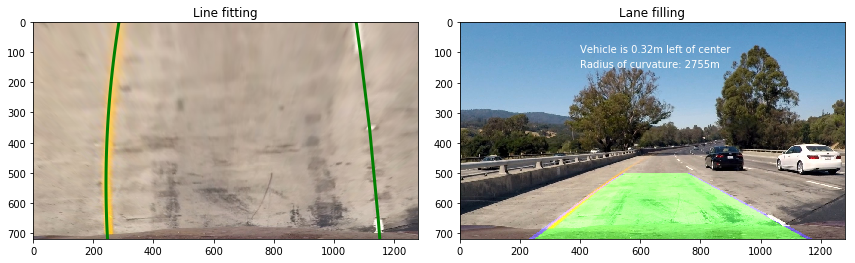

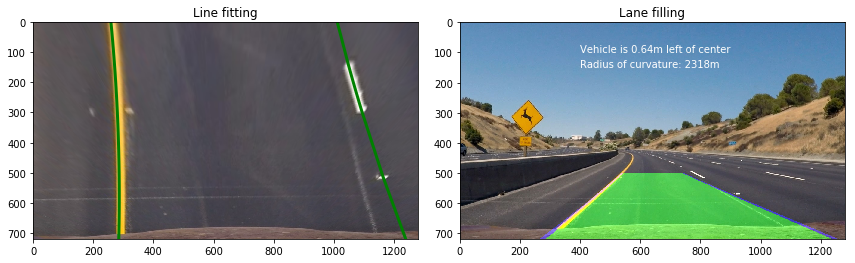

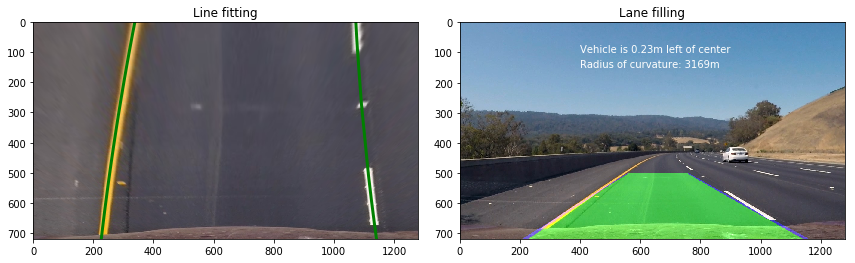

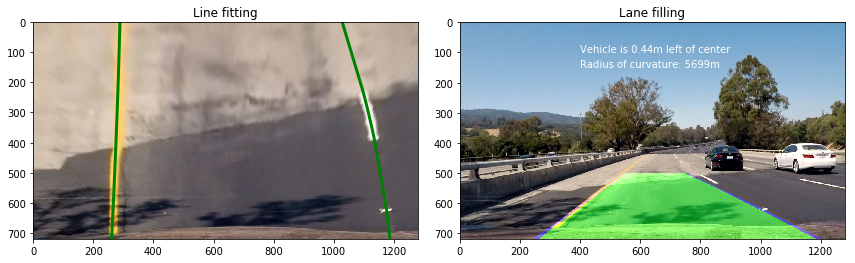

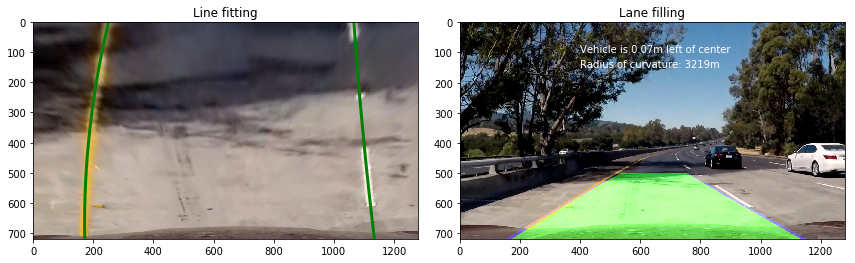

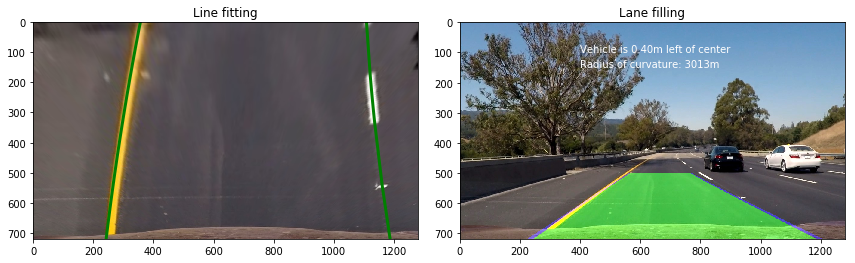

In [6]:
# Processing images and lines

def lane_filling(image):
    
    comb_binary = thresholds(image, show=False)
    
    leftx = []
    lefty = []
    rightx = []
    righty = []
    
    x, y = np.nonzero(np.transpose(comb_binary))
    i = 720
    j = 630
    
    while j >= 0:
        histogram = np.sum(comb_binary[j:i,:], axis=0)
        left_peak = np.argmax(histogram[:640])
        x_idx = np.where((((left_peak - 25) < x)&(x < (left_peak + 25))&((y > j) & (y < i))))
        x_window, y_window = x[x_idx], y[x_idx]
        
        if np.sum(x_window) != 0:
            leftx.extend(x_window.tolist())
            lefty.extend(y_window.tolist())

        right_peak = np.argmax(histogram[640:]) + 640
        x_idx = np.where((((right_peak - 25) < x)&(x < (right_peak + 25))&((y > j) & (y < i))))
        x_window, y_window = x[x_idx], y[x_idx]
        if np.sum(x_window) != 0:
            rightx.extend(x_window.tolist())
            righty.extend(y_window.tolist())
        i -= 90
        j -= 90

    lefty = np.array(lefty).astype(np.float32)
    leftx = np.array(leftx).astype(np.float32)
    
    righty = np.array(righty).astype(np.float32)
    rightx = np.array(rightx).astype(np.float32)
    
    # Fitting a second order polynomial
    left_fit = np.polyfit(lefty, leftx, 2)  
    left_fitx = left_fit[0]*lefty**2 + left_fit[1]*lefty + left_fit[2]
    
    # Fitting a second order polynomial
    right_fit = np.polyfit(righty, rightx, 2)  
    right_fitx = right_fit[0]*righty**2 + right_fit[1]*righty + right_fit[2]
    
    rightx_int = right_fit[0]*720**2 + right_fit[1]*720 + right_fit[2]
    rightx = np.append(rightx,rightx_int)
    righty = np.append(righty, 720)
    rightx = np.append(rightx,right_fit[0]*0**2 + right_fit[1]*0 + right_fit[2])
    righty = np.append(righty, 0)
    
    leftx_int = left_fit[0]*720**2 + left_fit[1]*720 + left_fit[2]
    leftx = np.append(leftx, leftx_int)
    lefty = np.append(lefty, 720)
    leftx = np.append(leftx,left_fit[0]*0**2 + left_fit[1]*0 + left_fit[2])
    lefty = np.append(lefty, 0)
    
    lsort = np.argsort(lefty)
    rsort = np.argsort(righty)
    
    lefty = lefty[lsort]
    leftx = leftx[lsort]
    
    righty = righty[rsort]
    rightx = rightx[rsort]
    
    # Fitting a second order polynomial
    left_fit = np.polyfit(lefty, leftx, 2)
    left_fitx = left_fit[0]*lefty**2 + left_fit[1]*lefty + left_fit[2]
    
    # Fitting a second order polynomial
    right_fit = np.polyfit(righty, rightx, 2)
    right_fitx = right_fit[0]*righty**2 + right_fit[1]*righty + right_fit[2]
    
    # Radius of Curvature
    ym_per_pix = 30./720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meteres per pixel in x dimension
    
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    left_curverad = ((1 + (2*left_fit_cr[0]*np.max(lefty) + left_fit_cr[1])**2)**1.5) /np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*np.max(lefty) + right_fit_cr[1])**2)**1.5) /np.absolute(2*right_fit_cr[0])
    
    
    # vehicle position
    center = abs(640 - ((rightx_int+leftx_int)/2))
    
    offset = 0 
    img_size = (img.shape[1], img.shape[0])
     
    
    src = np.float32([[475, 500],[800, 500],[1250, 720],[100, 720]])
    dst = np.float32([[0, 0], [1250, 0], [1250, 720],[100, 720]])
    #src = np.float32([[490, 482],[810, 482],[1250, 720],[50, 720]])
    #dst = np.float32([[0, 0], [1280, 0], [1250, 720],[50, 720]])
    
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    warp_zero = np.zeros_like(comb_binary).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    pts_left = np.array([np.flipud(np.transpose(np.vstack([left_fitx, lefty])))])
    pts_right = np.array([np.transpose(np.vstack([right_fitx, righty]))])
    pts = np.hstack((pts_left, pts_right))
    
    cv2.polylines(color_warp, np.int_([pts]), isClosed=False, color=(0,0,255), thickness = 40)
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    
    new_warp = cv2.warpPerspective(color_warp, Minv, (comb_binary.shape[1], comb_binary.shape[0]))
    result = cv2.addWeighted(mpimg.imread(image), 1, new_warp, 0.5, 0)
    
    f, (ax1, ax2) = plt.subplots(1,2, figsize=(12, 9))
    f.tight_layout()
    
    ax1.imshow(cv2.cvtColor((warp(image, display=False)[0]), cv2.COLOR_BGR2RGB))
    ax1.set_xlim(0, 1280)
    ax1.set_ylim(0, 720)
    
    ax1.plot(left_fitx, lefty, color='green', linewidth=3)
    ax1.plot(right_fitx, righty, color='green', linewidth=3)
    ax1.set_title('Line fitting')
    ax1.invert_yaxis() # to visualize as we do the images
    
    ax2.imshow(result)
    ax2.set_title('Lane filling')
    
    if center < 640:
        ax2.text(400, 100, 'Vehicle is {:.2f}m left of center'.format(center*3.7/700), color='white', fontsize=10)
    else:
        ax2.text(400, 100, 'Vehicle is {:.2f}m right of center'.format(center*3.7/700), color='white', fontsize=10)
    ax2.text(400, 150, 'Radius of curvature: {}m'.format(int((left_curverad + right_curverad)/2)), color='white', fontsize=10)
    
images = glob.glob('test_images/test*.jpg')
for image in images:
    lane_filling(image)

# Lane line characteristics

At this stage almost all the lane detection code is prepared. Now to use it for the video, first we are defining a class to store all the lane line attributes. Here we will be using several functions, which are going to be used to detect each lane pixels.

In [7]:
# Define a class to receive the characteristics of each line detection

class Line:
    def __init__(self):
        # Was the line found in the previous frame
        self.found = False
        
        # x and y values of lanes in previous frame
        self.X = None
        self.Y = None
        
        # recent x intercepts for averaging across frames
        self.x_int = deque(maxlen=10)
        self.top = deque(maxlen=10)
        
        # previous x intercept to compare against current one
        self.lastx_int = None
        self.last_top = None
        
        # radius of curvature
        self.radius = None
        
        # polynomial coefficients for averaging across frames
        self.fit0 = deque(maxlen=10)
        self.fit1 = deque(maxlen=10)
        self.fit2 = deque(maxlen=10)
        self.fitx = None
        self.pts = []
        
        # number of frames
        self.count = 0
        
    def found_search(self, x, y):
        xvals = []
        yvals = []
        if self.found == True: 
            i = 720
            j = 630
            
            while j >= 0:
                yval = np.mean([i,j])
                xval = (np.mean(self.fit0))*yval**2 + (np.mean(self.fit1))*yval + (np.mean(self.fit2))
                x_idx = np.where((((xval - 25) < x)&(x < (xval + 25))&((y > j) & (y < i))))
                x_window, y_window = x[x_idx], y[x_idx]
                
                if np.sum(x_window) != 0:
                    np.append(xvals, x_window)
                    np.append(yvals, y_window)
                i -= 90
                j -= 90
                
        if np.sum(xvals) == 0: 
            self.found = False # If no lane pixels were detected then perform blind search
            
        return xvals, yvals, self.found
    
    def blind_search(self, x, y, image):
        xvals = []
        yvals = []
        if self.found == False: 
            i = 720
            j = 630
            
            while j >= 0:
                histogram = np.sum(image[j:i,:], axis=0)
                if self == Right:
                    peak = np.argmax(histogram[640:]) + 640
                else:
                    peak = np.argmax(histogram[:640])
                x_idx = np.where((((peak - 25) < x)&(x < (peak + 25))&((y > j) & (y < i))))
                x_window, y_window = x[x_idx], y[x_idx]
                
                if np.sum(x_window) != 0:
                    xvals.extend(x_window)
                    yvals.extend(y_window)
                i -= 90
                j -= 90
                
        if np.sum(xvals) > 0:
            self.found = True
        else:
            yvals = self.Y
            xvals = self.X
            
        return xvals, yvals, self.found
    
    def radius_of_curvature(self, xvals, yvals):
        ym_per_pix = 30./720 # meters per pixel in y dimension
        xm_per_pix = 3.7/700 # meteres per pixel in x dimension
        fit_cr = np.polyfit(yvals*ym_per_pix, xvals*xm_per_pix, 2)
        curverad = ((1 + (2*fit_cr[0]*np.max(yvals) + fit_cr[1])**2)**1.5) /np.absolute(2*fit_cr[0])
        return curverad
    
    def sort_vals(self, xvals, yvals):
        sorted_index = np.argsort(yvals)
        sorted_yvals = yvals[sorted_index]
        sorted_xvals = xvals[sorted_index]
        return sorted_xvals, sorted_yvals
    
    def get_intercepts(self, polynomial):
        bottom = polynomial[0]*720**2 + polynomial[1]*720 + polynomial[2]
        top = polynomial[0]*0**2 + polynomial[1]*0 + polynomial[2]
        return bottom, top

# Video Processing

In this pipeline, a function is defined which takes video input and gives processed video as output. Input video image is used from the udacity repository. Output video gives the information of the lane curves and vehicle position with respect to the driving lane center, apart from lane line poly-fit and driving area shadding.

In [15]:
# Video Processing

def video_process(image):
    img_size = (image.shape[1], image.shape[0])
    
    # Camera Calibration  
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
    
    #undistorting image
    undist = cv2.undistort(image, mtx, dist, None, mtx)
    
    # perspective transformation
    offset = 0

    src = np.float32([[475, 500],[800, 500],[1250, 720],[100, 720]])
    dst = np.float32([[0, 0], [1250, 0], [1250, 720],[100, 720]])
    
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(undist, M, img_size, flags=cv2.INTER_LINEAR)
    
    # Binary thresholded images 
    #s_channel = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)[:,:,2]
    b_channel = cv2.cvtColor(warped, cv2.COLOR_RGB2Lab)[:,:,2]
    l_channel = cv2.cvtColor(warped, cv2.COLOR_RGB2LUV)[:,:,0]  
    
    # upper and lower S-thresholds
    #s_thresh_min = 180
    #s_thresh_max = 255
    #s_binary = np.zeros_like(s_channel)
    #s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1
    
    
    # upper and lower b-thresholds
    b_thresh_min = 145
    b_thresh_max = 200
    b_binary = np.zeros_like(b_channel)
    b_binary[(b_channel >= b_thresh_min) & (b_channel <= b_thresh_max)] = 1
    
    # upper and lower L-thresholds
    l_thresh_min = 215
    l_thresh_max = 255
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= l_thresh_min) & (l_channel <= l_thresh_max)] = 1

    comb_binary = np.zeros_like(b_binary)
    comb_binary[(b_binary == 1)| (l_binary == 1)] = 1
    
    # Identify all non zero pixels in the image
    x, y = np.nonzero(np.transpose(comb_binary)) 

    if Left.found == True: # Search for left lane pixels around previous polynomial
        leftx, lefty, Left.found = Left.found_search(x, y)
        
    if Right.found == True: # Search for right lane pixels around previous polynomial
        rightx, righty, Right.found = Right.found_search(x, y)
            
    if Right.found == False: # Perform blind search for right lane lines
        rightx, righty, Right.found = Right.blind_search(x, y, comb_binary)
            
    if Left.found == False:# Perform blind search for left lane lines
        leftx, lefty, Left.found = Left.blind_search(x, y, comb_binary)

    lefty = np.array(lefty).astype(np.float32)
    leftx = np.array(leftx).astype(np.float32)
    righty = np.array(righty).astype(np.float32)
    rightx = np.array(rightx).astype(np.float32)
            
    # left polynomial fit based on detected pixels
    left_fit = np.polyfit(lefty, leftx, 2)
    
    # Intercepts to extend the polynomial to the top and bottom of warped image
    leftx_int, left_top = Left.get_intercepts(left_fit)
    
    # Average intercepts across n frames
    Left.x_int.append(leftx_int)
    Left.top.append(left_top)
    leftx_int = np.mean(Left.x_int)
    left_top = np.mean(Left.top)
    Left.lastx_int = leftx_int
    Left.last_top = left_top
    
    # Add averaged intercepts to current x and y vals
    leftx = np.append(leftx, leftx_int)
    lefty = np.append(lefty, 720)
    leftx = np.append(leftx, left_top)
    lefty = np.append(lefty, 0)
    
    # Sort detected pixels based on the yvals
    leftx, lefty = Left.sort_vals(leftx, lefty)
    
    Left.X = leftx
    Left.Y = lefty
    
    # Recalculate polynomial with intercepts and average across n frames
    left_fit = np.polyfit(lefty, leftx, 2)
    Left.fit0.append(left_fit[0])
    Left.fit1.append(left_fit[1])
    Left.fit2.append(left_fit[2])
    left_fit = [np.mean(Left.fit0), 
                np.mean(Left.fit1), 
                np.mean(Left.fit2)]
    
    # Fit polynomial to detected pixels
    left_fitx = left_fit[0]*lefty**2 + left_fit[1]*lefty + left_fit[2]
    Left.fitx = left_fitx
    
    # Calculate right polynomial fit based on detected pixels
    right_fit = np.polyfit(righty, rightx, 2)

    # Calculate intercepts to extend the polynomial to the top and bottom of warped image
    rightx_int, right_top = Right.get_intercepts(right_fit)
    
    # Average intercepts across 5 frames
    Right.x_int.append(rightx_int)
    rightx_int = np.mean(Right.x_int)
    Right.top.append(right_top)
    right_top = np.mean(Right.top)
    Right.lastx_int = rightx_int
    Right.last_top = right_top
    rightx = np.append(rightx, rightx_int)
    righty = np.append(righty, 720)
    rightx = np.append(rightx, right_top)
    righty = np.append(righty, 0)
    
    # Sort right lane pixels
    rightx, righty = Right.sort_vals(rightx, righty)
    Right.X = rightx
    Right.Y = righty
    
    # Recalculate polynomial with intercepts and average across n frames
    right_fit = np.polyfit(righty, rightx, 2)
    Right.fit0.append(right_fit[0])
    Right.fit1.append(right_fit[1])
    Right.fit2.append(right_fit[2])
    right_fit = [np.mean(Right.fit0), np.mean(Right.fit1), np.mean(Right.fit2)]
    
    # Fit polynomial to detected pixels
    right_fitx = right_fit[0]*righty**2 + right_fit[1]*righty + right_fit[2]
    Right.fitx = right_fitx
        
    # Radius of curvature for each lane in meters
    left_curverad = Left.radius_of_curvature(leftx, lefty)
    right_curverad = Right.radius_of_curvature(rightx, righty)
        
    # Radius of curvature every 3 frames for improved readability
    if Left.count % 3 == 0:
        Left.radius = left_curverad
        Right.radius = right_curverad
        
    # vehicle position relative to the center of the lane
    position = (rightx_int+leftx_int)/2
    distance_from_center = abs((640 - position)*3.7/700) 
                
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    warp_zero = np.zeros_like(comb_binary).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    pts_left = np.array([np.flipud(np.transpose(np.vstack([Left.fitx, Left.Y])))])
    pts_right = np.array([np.transpose(np.vstack([right_fitx, Right.Y]))])
    pts = np.hstack((pts_left, pts_right))
    
    cv2.polylines(color_warp, np.int_([pts]), isClosed=False, color=(0,0,255), thickness = 40)
    cv2.fillPoly(color_warp, np.int_(pts), (34,255,34))
    
    new_warp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0]))
    result = cv2.addWeighted(undist, 1, new_warp, 0.5, 0)
        
    # distance from center on video
    if position > 640:
        cv2.putText(result, 'Vehicle is {:.2f}m left of center'.format(distance_from_center), (100,100),
                 fontFace = 16, fontScale = 2, color=(255,255,255), thickness = 2)
    else:
        cv2.putText(result, 'Vehicle is {:.2f}m right of center'.format(distance_from_center), (100,100),
                 fontFace = 16, fontScale = 2, color=(255,255,255), thickness = 2)
    # Print radius of curvature on video
    cv2.putText(result, 'Radius of Curvature: {}(m)'.format(int((Left.radius+Right.radius)/2)), (100,150),
             fontFace = 16, fontScale = 2, color=(255,255,255), thickness = 2)
    Left.count += 1
    return result

# Video creation

In [16]:
Left = Line()
Right = Line()
video_output = 'project_video_result.mp4'
test_clip = VideoFileClip("project_video.mp4")
video_clip = test_clip.fl_image(video_process) 
video_clip.write_videofile(video_output)

[MoviePy] >>>> Building video project_video_result.mp4
[MoviePy] Writing audio in project_video_resultTEMP_MPY_wvf_snd.mp3


100%|█████████████████████████████████████| 1112/1112 [00:02<00:00, 379.24it/s]


[MoviePy] Done.
[MoviePy] Writing video project_video_result.mp4


100%|█████████████████████████████████████▉| 1260/1261 [27:27<00:01,  1.30s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_result.mp4 



# Video Output

In [17]:
from IPython.display import HTML
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format('project_video_result.mp4'))

# Conclusion

For the project video this code is running fine. Though for slightly difficult chllaging video, this is not tracing the path correctly. There are distortion happening in the lane tracing, specially in shadow condition. 

I believe this can be improved by using better color and gradient threshold. There are so many methods and parameters available, which needs to be analyzed for the optimum solution.

There are several limitations in this current code to make it suitable for most of real time driving scenario:

> Multiple lines on some crossings

> Zebra crossings in between

> Bad weather

> Water/ice on road

> Vehicle in the front

> Bad traffic condition etc

All these conditions needs extra training of the model and using mix of several algorithm and methods. 